In [1]:
#importing the necessary libaries
from skimage import io
import numpy as np
from matplotlib import pyplot as plt
from skimage.data import camera
from skimage.util import compare_images
from skimage.filters import roberts,sobel,scharr,prewitt
import os
import h5py
import numpy as np
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
import cv2
from skimage import exposure, filters
import numpy as np
from sklearn.decomposition import PCA
from skimage import io
import numpy as np
from matplotlib import pyplot as plt
from glob import glob
from keras.metrics import Recall, Precision, Accuracy

C:\ProgramData\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
root = "C:/Users/User_ensias/Desktop/"
exts = ('jpg', 'JPG', 'png', 'PNG', 'tif', 'gif', 'ppm','jpeg')

In [3]:
input_data_train = os.path.join(root, 'train/image')
X_train = sorted(
    [
        os.path.join(input_data_train, fname)
        for fname in os.listdir(input_data_train)
        if fname.endswith(exts) and not fname.startswith(".")
    ]
)


In [4]:
# target list

output_data_train = os.path.join(root, 'train/mask')
y_train = sorted(
    [
        os.path.join(output_data_train, fname)
        for fname in os.listdir(output_data_train)
        if fname.endswith(exts) and not fname.startswith(".")
    ]
)


In [5]:
input_data_test = os.path.join(root, 'test/image')
X_test = sorted(
    [
        os.path.join(input_data_test, fname)
        for fname in os.listdir(input_data_test)
        if fname.endswith(exts) and not fname.startswith(".")
    ]
)

In [6]:
# target list

output_data_test = os.path.join(root, 'test/mask')
y_test = sorted(
    [
        os.path.join(output_data_test, fname)
        for fname in os.listdir(output_data_test)
        if fname.endswith(exts) and not fname.startswith(".")
    ]
)

In [7]:
X_train_paths = X_train
X_test_paths = X_test
y_train_paths = y_train
y_test_paths = y_test

In [8]:
def load_images_X(paths):
    images = []
    for path in paths:
        img = cv2.imread(path)
        img = cv2.resize(img, (256, 256))  # Redimensionnez l'image si nécessaire
        img_array = np.array(img)
        img_array = img_array.astype('float32') / 255.0
        images.append(img_array)
    return np.array(images)

def load_images_y(paths):
    images = []
    for path in paths:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (256, 256))  # Redimensionnez l'image si nécessaire
        img_array = np.array(img)
        img_array = img_array.astype('float32') / 255.0
        images.append(img_array)
    return np.array(images)

In [9]:
# Chargement des images non segmentées
X_train = load_images_X(X_train_paths)
X_test = load_images_X(X_test_paths)

# Chargement des images segmentées correspondantes
y_train = load_images_y(y_train_paths)
y_test = load_images_y(y_test_paths)

In [10]:
print(len(X_train))
print(len(X_test))

print(len(y_train))
print(len(y_test))


4260
54
4260
54


In [11]:
list_type = type(X_test[0])
print(list_type)

<class 'numpy.ndarray'>


Residual Unet model

In the traditional U-Net, the encoder and decoder paths are connected by direct concatenation of feature maps at corresponding resolution levels. This allows the decoder to have access to high-resolution information from the encoder, aiding in the precise localization of objects. However, in deep networks, gradient flow can become an issue, which can hinder training.

To address this problem, the Residual U-Net introduces residual connections, inspired by the ResNet architecture. Residual connections allow the model to bypass certain layers and pass the input directly to subsequent layers. This helps in mitigating the vanishing gradient problem and enables better propagation of gradients during training.

In [12]:
from tensorflow import keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, UpSampling2D

In [13]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, UpSampling2D, Add

def residual_unet(input_shape):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bottom
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    # Decoder
    up6 = UpSampling2D(size=(2, 2))(conv5)
    up6 = Conv2D(512, 2, activation='relu', padding='same')(up6)
    merge6 = concatenate([conv4, up6], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)
    conv6 = Add()([conv6, up6])

    up7 = UpSampling2D(size=(2, 2))(conv6)
    up7 = Conv2D(256, 2, activation='relu', padding='same')(up7)
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)
    conv7 = Add()([conv7, up7])

    up8 = UpSampling2D(size=(2, 2))(conv7)
    up8 = Conv2D(128, 2, activation='relu', padding='same')(up8)
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)
    conv8 = Add()([conv8, up8])

    up9 = UpSampling2D(size=(2, 2))(conv8)
    up9 = Conv2D(64, 2, activation='relu', padding='same')(up9)
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)
    conv9 = Add()([conv9, up9])

    # Output
    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs=inputs, outputs=outputs)
    return model

In [14]:
# Create the residual UNet model
input_shape = (256, 256, 3)
model = residual_unet(input_shape)

# Print the model summary
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

In [15]:
import tensorflow as tf
def iou(y_true, y_pred):
    def f(y_true, y_pred):
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + 1e-15) / (union + 1e-15)
        x = x.astype(np.float32)
        return x
    return tf.numpy_function(f, [y_true, y_pred], tf.float32)

smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
        return binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

In [16]:
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam

# Compilation du modèle
model.compile(optimizer=Adam(learning_rate=0.001),
              loss=BinaryCrossentropy(),
              metrics=[dice_coef, iou, Recall(), Precision(), Accuracy()])

In [17]:
# Entraînement du modèle
model.fit(X_train, y_train, batch_size=64, epochs=10, validation_data=(X_test, y_test))

Epoch 1/10
67/67 [==============================] - 10365s 155s/step - loss: 0.2826 - dice_coef: 0.0931 - iou: 0.0489 - recall: 0.0019 - precision: 0.1944 - accuracy: 0.0000e+00 - val_loss: 0.2603 - val_dice_coef: 0.0746 - val_iou: 0.0387 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00 - val_accuracy: 0.0000e+00
Epoch 2/10
67/67 [==============================] - 10440s 156s/step - loss: 0.2112 - dice_coef: 0.1871 - iou: 0.1040 - recall: 0.0257 - precision: 0.8711 - accuracy: 7.1638e-09 - val_loss: 0.1977 - val_dice_coef: 0.2339 - val_iou: 0.1324 - val_recall: 0.0262 - val_precision: 0.9795 - val_accuracy: 0.0000e+00
Epoch 3/10
67/67 [==============================] - 10236s 153s/step - loss: 0.1787 - dice_coef: 0.2995 - iou: 0.1765 - recall: 0.0914 - precision: 0.9081 - accuracy: 3.5819e-09 - val_loss: 0.1782 - val_dice_coef: 0.3332 - val_iou: 0.1999 - val_recall: 0.1075 - val_precision: 0.9703 - val_accuracy: 0.0000e+00
Epoch 4/10
67/67 [==============================] - 10271s 

In [18]:
# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)

# Print the accuracy
print("Accuracy:", accuracy)

2/2 [==============================] - 37s 14s/step - loss: 0.1457 - dice_coef: 0.5483 - iou: 0.3803 - recall: 0.2002 - precision: 0.9651 - accuracy: 0.0000e+00


ValueError: too many values to unpack (expected 2)

In [19]:
y_predict = model.predict(X_test)

2/2 [==============================] - 36s 14s/step


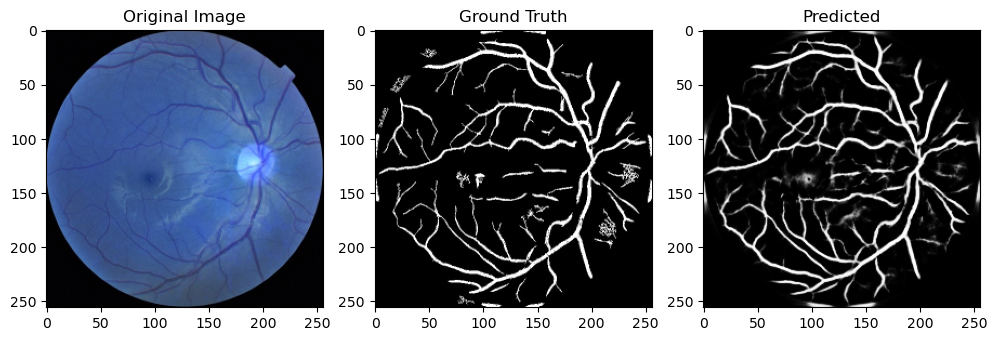

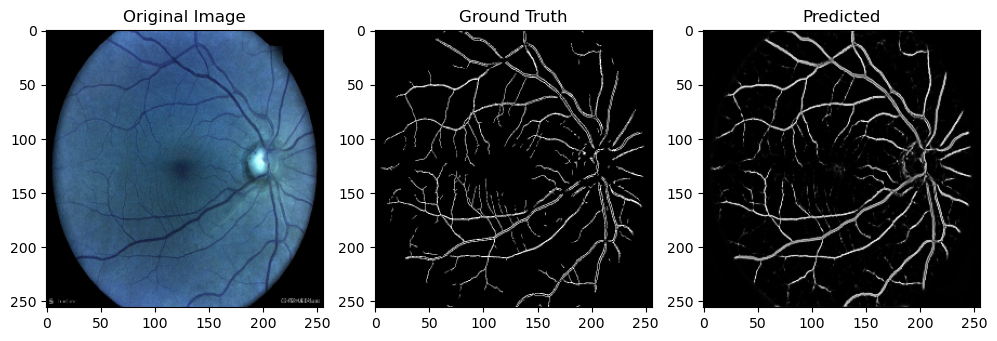

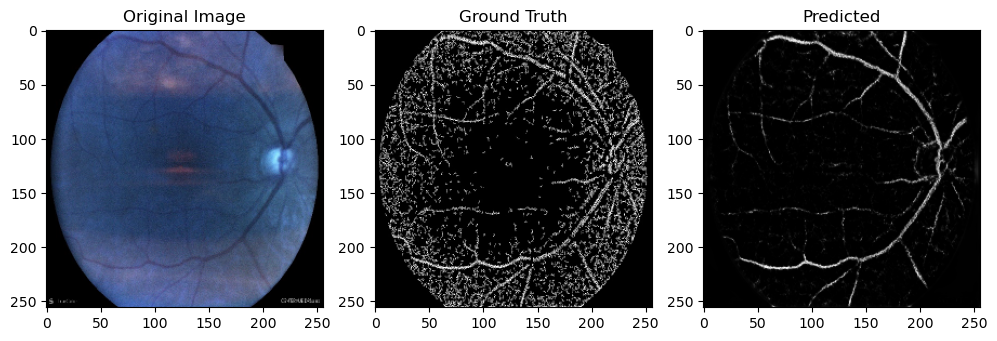

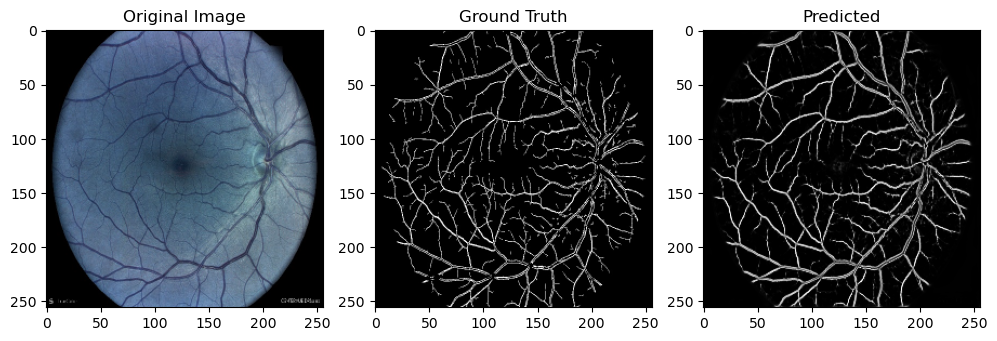

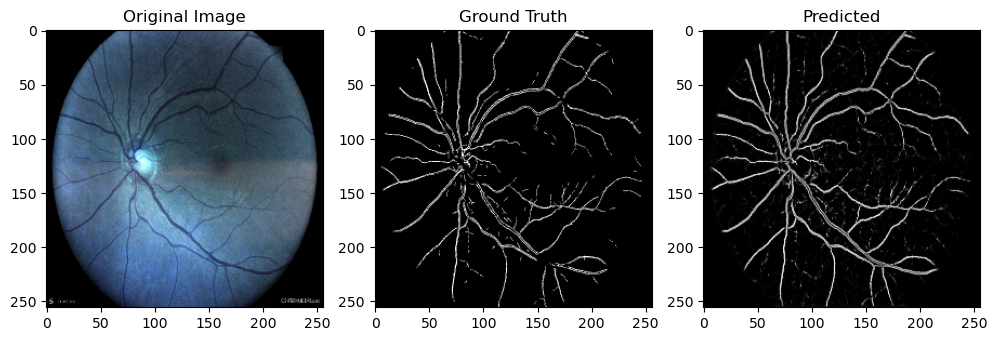

...

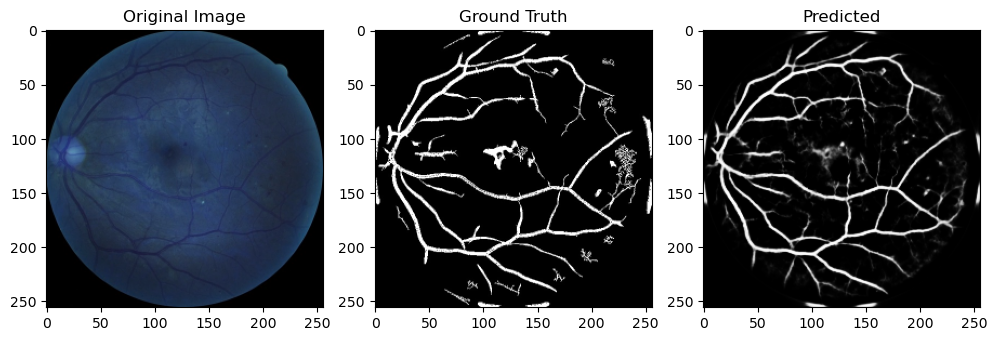

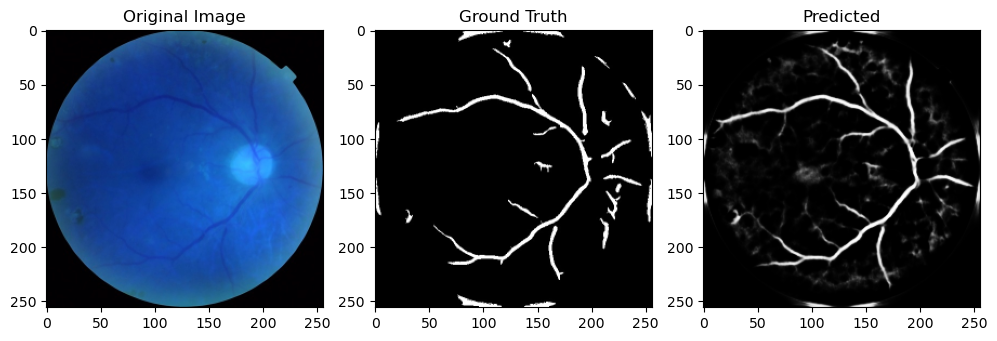

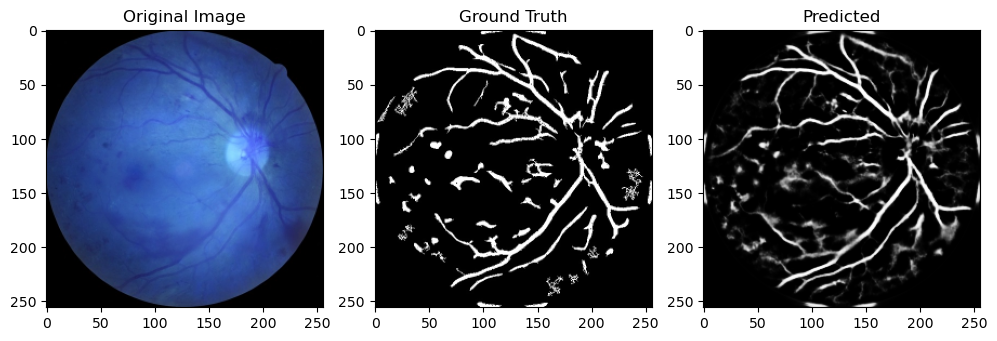

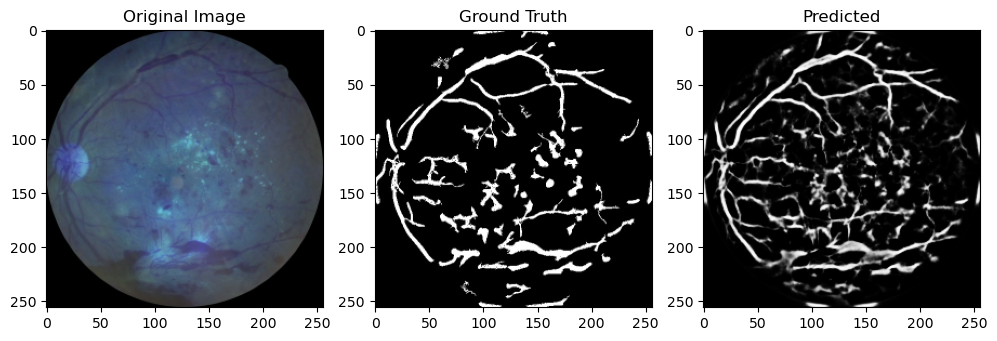

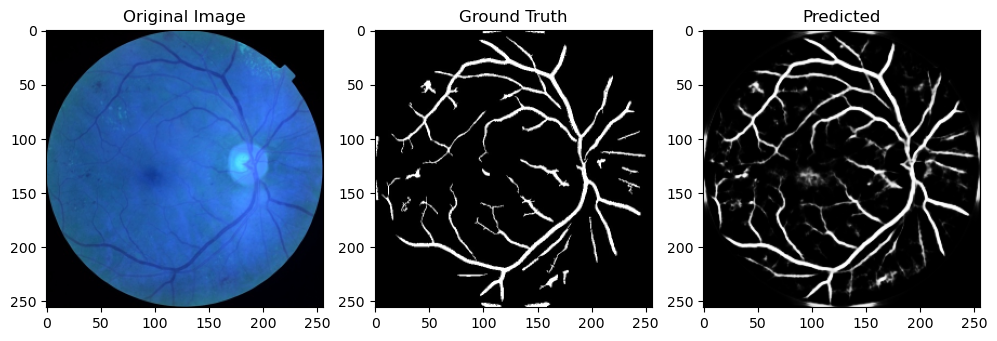

In [21]:

num_images = len(X_test)

# Iterate over the images and plot them
for i in range(num_images):
    plt.figure(figsize=(10, 5))

    # Plot the original image
    plt.subplot(1, 3, 1)
    plt.imshow(X_test[i])
    plt.title("Original Image")

    # Plot the ground truth label
    plt.subplot(1, 3, 2)
    plt.imshow(y_test[i], cmap = 'gray')
    plt.title("Ground Truth")

    # Plot the predicted label
    plt.subplot(1, 3, 3)
    plt.imshow(y_predict[i], cmap = 'gray')
    plt.title("Predicted")

    plt.tight_layout()
    plt.show()

In [ ]:
# Afficher les masques prédits
for i in range(len(X_test)):
    predicted_mask = y_predict[i]
    #predicted_mask = y_predict.reshape((512,512))
    plt.imshow(predicted_mask, cmap='gray')
    plt.show()

In [22]:
import numpy as np
from sklearn.metrics import jaccard_score, precision_score, recall_score, accuracy_score

# Convertir les prédictions en masques binaires (0 et 1)
y_pred_binary = np.round(y_predict).astype(np.uint8)
y_true_binary = np.round(y_test).astype(np.uint8)

# Supprimer la dimension supplémentaire de y_pred_binary
y_pred_binary = np.squeeze(y_pred_binary, axis=3)

# Calculer l'Intersection over Union (IoU)
iou = jaccard_score(y_true_binary.flatten(), y_pred_binary.flatten())

# Calculer le Dice Coefficient
dice = 2 * np.sum(y_true_binary * y_pred_binary) / (np.sum(y_true_binary) + np.sum(y_pred_binary))

# Calculer la précision et la sensibilité
precision = precision_score(y_true_binary.flatten(), y_pred_binary.flatten())
recall = recall_score(y_true_binary.flatten(), y_pred_binary.flatten())

# Calculer l'exactitude (accuracy)
accuracy = accuracy_score(y_true_binary.flatten(), y_pred_binary.flatten())

print("Intersection over Union (IoU):", iou)
print("Dice Coefficient:", dice)
print("Précision:", precision)
print("Sensibilité:", recall)
print("Exactitude (Accuracy):", accuracy)

Intersection over Union (IoU): 0.5571260073404893
Dice Coefficient: 0.7155824316261198
Précision: 0.7888230629285814
Sensibilité: 0.654786797391695
Exactitude (Accuracy): 0.9620163529007523


In [23]:
model.save('C:/Users/User_ensias/Desktop/DATA/residiel unet.h5')